# Segmentación de glándulas de Meibomio usando arquitectura U-NET


## Cristian David Gutiérrez & Nicolás Echeverri Rojas


## 0. Instalación de Segmentation models

In [ ]:
!pip install segmentation-models-pytorch
!pip install -U git+https://github.com/albumentations-team/albumentations
#!pip install --upgrade opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 97 kB 2.4 MB/s 
     |████████████████████████████████| 58 kB 6.0 MB/s 
     |████████████████████████████████| 376 kB 30.5 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=b55ceb0dad792b50ad38c94e50caeb47ebb7e1e61a559e55ad623eda9911b47c
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60966 sha256=e6cc1a44eeaf4a8e9475ea373ccc9520447ba8666716e2f6ed18c7f67cf67925
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built efficientnet-pytorch pretrainedmodels
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning htt

In [ ]:
!nvidia-smi

Tue Nov 29 20:53:38 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  A100-SXM4-40GB      Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    46W / 400W |      0MiB / 40536MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive




## 1. Importación de Librerías

In [ ]:
import sys

In [ ]:
import torch 
import cv2

import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 

from sklearn.model_selection import train_test_split
from tqdm import tqdm

import helper

In [ ]:
# Esta es la función que llama Helper
def show_image(image,mask,pred_image = None):
    
    if pred_image == None:
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        
        ax1.set_title('IMAGE')
        ax1.imshow(image.permute(1,2,0).squeeze(),cmap = 'gray')
        
        ax2.set_title('GROUND TRUTH')
        ax2.imshow(mask.permute(1,2,0).squeeze(),cmap = 'gray')
        
    elif pred_image != None :
        
        f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(20,10))
        
        ax1.set_title('IMAGE')
        ax1.imshow(image.permute(1,2,0).squeeze(),cmap = 'gray')
        
        ax2.set_title('GROUND TRUTH')
        ax2.imshow(mask.permute(1,2,0).squeeze(),cmap = 'gray')
        
        ax3.set_title('MODEL OUTPUT')
        ax3.imshow(pred_image.permute(1,2,0).squeeze(),cmap = 'gray')
        

## 2. Carga de datos

In [ ]:
#Para los usuarios externos crear un acceso directo de la carpeta compartida a la unidad
#Dar click derecho a la carpeta compartida y en "Añadir acceso directo a drive"

CSV_FILE_sup=           '/content/drive/MyDrive/proyecto aprendizaje estadistico/mascaras.csv'                    #documento donde están los nombres de las máscaras
DATA_DIR_images_sup=   '/content/drive/MyDrive/proyecto aprendizaje estadistico/data/class_1/superior/'           #dirección donde están las imagenes a segmentar
DATA_DIR_mask_sup=   '/content/drive/MyDrive/proyecto aprendizaje estadistico/data/class_1/superior/Segmentación/' #dirección donde están las imagenes a segmentadas
  
DEVICE="cuda"  #para tener GPU, sino poner cpu
#CUDA es una API que permite acceder a los componentes de la GPU
#Sin embargo, PyTorch lo hace más fácil para nosotros y permite acceder a todos los componentes
#en una entidad total --> GPU


IMG_SIZE_H=512 #rescalamiento de la imagen en la parte horizontal
IMG_SIZE_V=256 #reescalamiento de la imagen en la parte vertical 

#Deben de ser divisibles por 32 

In [ ]:
pd.set_option('max_colwidth', 120)

In [ ]:
df_sup=pd.read_csv(CSV_FILE_sup) #df con los nombre de las imágenes y las máscaras

In [ ]:
df_sup['imagenes'] = DATA_DIR_images_sup+df_sup['imagenes']
df_sup['mascaras'] = DATA_DIR_mask_sup+df_sup['mascaras']
df_sup['class'] = np.zeros_like(df_sup['imagenes'])

In [ ]:
CSV_FILE_inf=           '/content/drive/MyDrive/proyecto aprendizaje estadistico/mascaras_inf.csv'                    #documento donde están los nombres de las máscaras
DATA_DIR_images_inf=   '/content/drive/MyDrive/proyecto aprendizaje estadistico/data/class_1/inferior/'           #dirección donde están las imagenes a segmentar
DATA_DIR_mask_inf=     '/content/drive/MyDrive/proyecto aprendizaje estadistico/data/class_1/inferior/segmentación/' #dirección donde están las imagenes a segmentadas
  
DEVICE="cuda"  #para tener GPU, sino poner cpu
#CUDA es una API que permite acceder a los componentes de la GPU
#Sin embargo, PyTorch lo hace más fácil para nosotros y permite acceder a todos los componentes
#en una entidad total --> GPU


IMG_SIZE_H=512 #rescalamiento de la imagen en la parte horizontal
IMG_SIZE_V=256 #reescalamiento de la imagen en la parte vertical 

In [ ]:
df_inf=pd.read_csv(CSV_FILE_inf) #df con los nombre de las imágenes y las máscaras
df_inf['imagenes'] = DATA_DIR_images_inf + df_inf['imagenes']
df_inf['mascaras'] = DATA_DIR_mask_inf + df_inf['mascaras']
df_inf['class'] = np.ones_like(df_inf['imagenes'])

In [ ]:
df = pd.concat([df_sup,df_inf], axis = 0)
df.reset_index(drop = True, inplace = True)

## 3. Visualización preliminar de las imágenes

In [ ]:
idx=73
row=df.iloc[idx]

image_path=row['imagenes']
mask_path=row['mascaras']


In [ ]:
image=cv2.imread(image_path) 
image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #cambia BGR to RGB (porque cv2 lo sube en BGR (Blue, Green, Red))
mask=cv2.imread(mask_path, cv2.THRESH_BINARY) #Lo cambia a escala de grises
mask = np.where(mask>15, 255, 0) #Binarización de la máscara.

##999x468 dimensión orginal de las imágenes

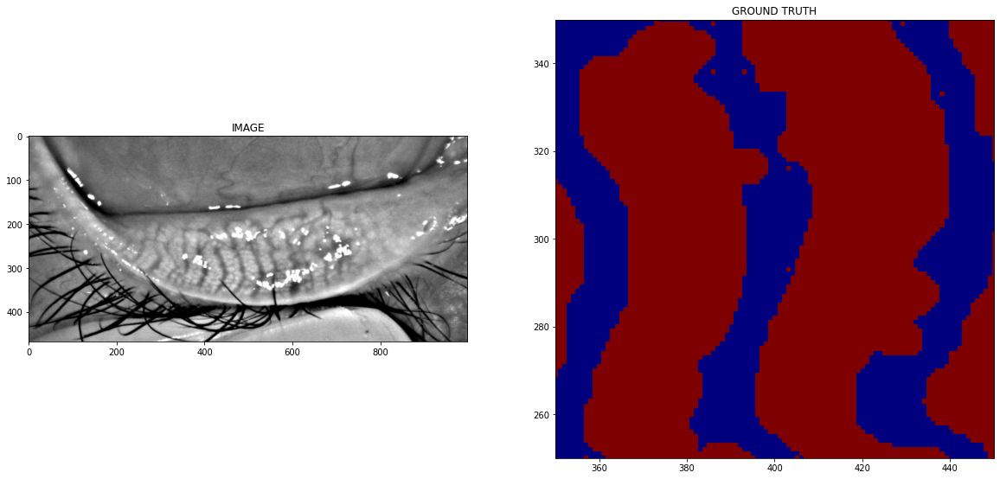

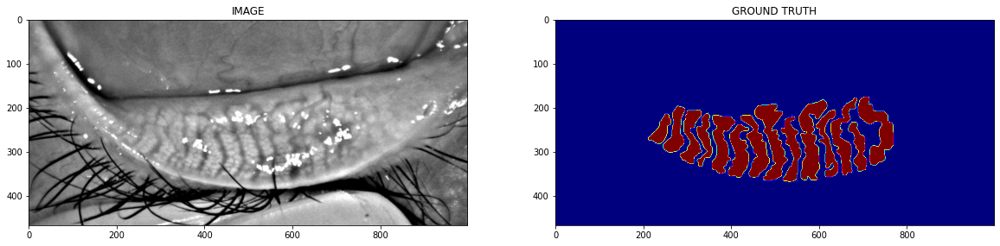

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        
ax1.set_title('IMAGE')
ax1.imshow(image)

ax2.set_title('GROUND TRUTH')
ax2.imshow(mask,cmap = 'jet')
ax2.set_xlim(350, 450)
ax2.set_ylim(250, 350)


################################################
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('IMAGE')
ax1.imshow(image)

ax2.set_title('GROUND TRUTH')
ax2.imshow(mask,cmap = 'jet')



In [ ]:
mask.shape
np.unique(mask)

array([  0, 255])

## 4. División estratificada para entrenamiento y test

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit
#dividiendo los nombres de los archivos a entrenar
X = df['imagenes']
y = df['class']
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
#train_df, valid_df = train_test_split(df, test_size=0.20, random_state=42)

for train_index, test_index in sss.split(X, y):
     print("TRAIN:", train_index, "TEST:", test_index)
     X_train, X_test = X.loc[train_index], X.loc[test_index]
     y_train, y_test = y.loc[train_index], y.loc[test_index]

TRAIN: [74 45 16 35 39 26 13 23  1 40 43 67 49 36 60 61  3  5 42 72 63 30 69 47
  4 73 32 25 17 71 52  8 64 51 24  6 56 33 57 34 53  2 29 21  0 38  9 11
 50 37 68 27 19 59 66 12 48 15 54 70] TEST: [41 10 18 28 55 46  7 65 14 62 44 31 22 58 20]


In [ ]:
train_df = df.iloc[train_index]
valid_df = df.iloc[test_index]

In [ ]:
train_df.reset_index(drop = True, inplace = True)
valid_df.reset_index(drop = True, inplace = True)

## 5. Creación de funciones de data augmentation
Welcome to Albumentations documentation

Albumentations is a fast and flexible image augmentation library.


A.compose: contiene los diferentes métodos que se desean usar para aumentar los datos

p=0.5 means that with a probability of 50%, the transform will flip the image horizontally, and with a probability of 50%, the transform won't modify the input image.

albumentation documentation : https://albumentations.ai/docs/

In [ ]:
import albumentations as A

#Para entrenamiento
def get_train_augs():
  return A.Compose([
      A.Resize(IMG_SIZE_V, IMG_SIZE_H),
      A.HorizontalFlip(p=0.5),
      A.VerticalFlip(p=0.5)
  ])


#Para validación (no se debe de realizar augmentation)
def get_valid_augs():
  return A.Compose([
      A.Resize(IMG_SIZE_V, IMG_SIZE_H)
  ])


## 6. Creación de estructura de Dataset para posterior entrenamiento

In [ ]:
from torch.utils.data import Dataset

In [ ]:
class SegmentationDataset(Dataset):  #heredando de la clase Dataset de torch

  def __init__(self, df, augmentation):
    self.df = df #dataframe donde están los nombres de las imágenes
    self.augmentation = augmentation #función de data augmentation

  def __len__(self):
    return len(self.df)  #Para que se pueda conocer la cantidad de datos

  def __getitem__(self, idx):
    row=self.df.iloc[idx]    #para que 

    #accediendo a las direcciones
    image_path=row['imagenes']
    mask_path=row['mascaras']

    #leyendo imágenes
    image=cv2.imread(image_path)
    image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)# cambiando a RGB (h,w,c)--> (height, width, channels)
    
    mask=cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)# Cambiando a escala de grises (h,v) 

    mask = np.where(mask>15, 255, 0) #Binarización de la máscara.
    mask=np.expand_dims(mask, axis=-1 )#agrega otro axis (h,w,c) para que tanto las dimensiones de las imagenes como de las máscaras coincidan

                                       # Shape of the image should be (batch_size, num_channels, height, width)
                                       # if you work with grayscale images, expand channels dim to have [batch_size, 1, height, width]

    if (self.augmentation):
      data = self.augmentation(image=image, mask=mask)  #aplicando la función de augmentación de datos tanto a image como a las máscaras
      image=data["image"] #como se la pasa sin argumentos, se guarda el resultado en diccionarios cuyas llaves son los nombres de los atributos
      mask=data["mask"]

    image = np.transpose(image, (2,0,1)).astype(np.float32)
    #Esto lo que hace es cambiar el orden de (h,w,c) a (c,h,w). Como channel está en la posición 2 originalmente y se quiere poner de primero entonces la primera entrada es 2
    #luego se quiere que height esté en la mitad, por tanto se como estaba originalmente en 0, se pone este en la mitad
    #Por último se desea width de último entonces se coloca el 1 qu era la posición original de él de último

    mask = np.transpose(mask, (2,0,1)).astype(np.float32) #(c,h,w) lo mismo se hace con las máscaras

    image=torch.Tensor(image)/255  #normalizando 
    mask=torch.round(torch.Tensor(mask)/255) #se divide por 225 y se aplica round para que sea una imagen de 0 y 1
    return image, mask

In [ ]:
#Inicializando las funciones
trainset=SegmentationDataset(train_df, get_train_augs())
validset=SegmentationDataset(valid_df, get_valid_augs())
testset=SegmentationDataset(valid_df, get_valid_augs())

In [ ]:
len(trainset)

60

In [ ]:
len(validset) #se puede hacer esto pues se le dío el atributo len

15

## 6.1 Carga de datos por tamaño de batch

In [ ]:
from torch.utils.data import DataLoader

In [ ]:
BATCH_SIZE=8  #batch

In [ ]:
trainloader=DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True)
validloader=DataLoader(validset, batch_size=BATCH_SIZE)

testloader = DataLoader(validset, batch_size=BATCH_SIZE)

In [ ]:
#batch in train loader
len(trainloader)

8

In [ ]:
for image, mask in trainloader:
  print(f"Image shape(One batch) :{image.shape}")
  print(f"Image shape(One batch) :{mask.shape}")
  break;

#Observando un batch, las dimensiones de esta son: (batch, canales, altura, ancho)

Image shape(One batch) :torch.Size([8, 3, 256, 512])
Image shape(One batch) :torch.Size([8, 1, 256, 512])


## 7. Instanciación del modelo de la librería Segmentation Models

segmentation_models_pytorch documentation : https://smp.readthedocs.io/en/latest/

In [ ]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from torch import nn

In [ ]:
ENCODER='timm-efficientnet-b0'
WEIGHTS="imagenet"

## https://github.com/qubvel/segmentation_models.pytorch
github de la librería

Pytorch Image Models (a.k.a. timm) has a lot of pretrained models and interface which allows using these models as encoders in smp, however, not all models are supported

en Auxiliary classification output explican como se implementa droupout


### Significado de parámetros
enconder: Existen muchos encoder disponibles, vamos a usar timm encoder

en el link también esta el loss para segmentar, en este caso DiceLoss

blackbone: va a ser la arqutecutra que vamos a usar

in channels: numero de canales que tenemos, en este caso 3, canal, altura, ancho
classes: 1, pues solo es 0 o 1


### BlackBone

Generally a backbone refers to some “base model” of the overall architecture, which can be changed for another one.
E.g. some detection models use a resnet as the default backbone, which you could swap for e.g. a VGG model or your custom one



### Significado de Logit
A Logit function, also known as the log-odds function, is a function that represents probability values from 0 to 1, and negative infinity to infinity. The function is an inverse to the sigmoid function


The Logit function is used similarly to the sigmoid function in neural networks. The sigmoid, or activation, function produces a probability, whereas the Logit function takes a probability and produces a real number between negative and positive infinity  Like the sigmoid function, Logit functions are often placed as the last layer in a neural network as can simplify the data. For example, a Logit function is often used in the final layer of a neural network used in classification tasks. As the network determines probabilities for classification, the Logit function can transform those probabilities to real numbers. 

# 8. Creación de funciones para entrenamiento y testing


In [ ]:
import matplotlib.pyplot as plt

import matplotlib
font = {'size'   : 25, 'family':'STIXGeneral'}
axislabelfontsize='large'
matplotlib.rc('font', **font)
#matplotlib.mathtext.rcParams['legend.fontsize']='medium'

In [ ]:
def train_fn(dataloader, model, optimizer):
  model.train()#this method turn on dropout, batchnorm, etc because we are training 
  total_loss=0.0

  #Entrenando en el batch
  for images, masks in tqdm(dataloader):
    images=images.to(DEVICE) #convirtiendo al divice seleccionado (CPU o GPU)
    masks=masks.to(DEVICE) 

    optimizer.zero_grad()   #reiniciando el gradiente a 0
    logits, loss =model(images, masks )  #como se está entrenando se le pasa los dos

    loss.backward() #back propagation loss
    optimizer.step() #adjust weights
    total_loss+=loss.item() 
    
  return total_loss/len(dataloader)




def eval_fn(dataloader, model):

  model.eval()#Turning off dropout, batchnorm, etc becuase we dont want to train with this data

  total_loss=0.0
  with torch.no_grad():  #Para no actualizar los pesos con los datos de validación
    for images, masks in tqdm(dataloader):
      images=images.to(DEVICE)
      masks=masks.to(DEVICE)

      logits, loss =model(images, masks )  
  
      total_loss+=loss.item()
  return total_loss/len(dataloader)



def test_fn(dataloader, model):

  model.eval()#Turn off dropout, batchnomr, et
  total_loss=0.0
  with torch.no_grad():  #Para no actualizar los pesos con los datos de validación
    for images, masks in tqdm(dataloader):
      images=images.to(DEVICE)
      masks=masks.to(DEVICE)

      logits, loss =model(images, masks )  

      total_loss+=loss.item()
  return logits.sigmoid()

In [ ]:
def show_results(set_images,idx):
  image, mask =set_images[idx] 
  logits_mask = model(image.to(DEVICE).unsqueeze(0))

  pred_mask = torch.sigmoid(logits_mask) 
  pred_mask = (pred_mask >0.5)*1.0
  show_image(image, mask, pred_mask.detach().cpu().squeeze(0) )


## 9. Grid search en el entrenamiento del modelo con los hiperparámetros Learning rate, Dropout rate, regularización L2

DR=0.2, WD=0.0001




100%|██████████| 2/2 [00:00<00:00,  6.72it/s]


SAVED MODEL
Epoch:1 train loss:1.1971867233514786 valid loss:1.435062050819397


100%|██████████| 2/2 [00:00<00:00,  6.92it/s]


SAVED MODEL
Epoch:2 train loss:0.9162752628326416 valid loss:1.1601364612579346


100%|██████████| 2/2 [00:00<00:00,  7.08it/s]


Epoch:3 train loss:0.7390553951263428 valid loss:1.2242882251739502


100%|██████████| 2/2 [00:00<00:00,  7.01it/s]


SAVED MODEL
Epoch:4 train loss:0.6366911455988884 valid loss:0.8547076284885406


100%|██████████| 2/2 [00:00<00:00,  7.10it/s]


SAVED MODEL
Epoch:5 train loss:0.5515859574079514 valid loss:0.6145907640457153


100%|██████████| 2/2 [00:00<00:00,  7.04it/s]


SAVED MODEL
Epoch:6 train loss:0.5081405490636826 valid loss:0.5554512143135071


100%|██████████| 2/2 [00:00<00:00,  7.03it/s]


Epoch:7 train loss:0.45753971114754677 valid loss:0.6899589896202087


100%|██████████| 2/2 [00:00<00:00,  6.99it/s]


Epoch:8 train loss:0.44450288638472557 valid loss:0.5846728682518005


100%|██████████| 2/2 [00:00<00:00,  6.90it/s]


SAVED MODEL
Epoch:9 train loss:0.42617471516132355 valid loss:0.5525355637073517


100%|██████████| 2/2 [00:00<00:00,  7.12it/s]


Epoch:10 train loss:0.4186917692422867 valid loss:0.5708886682987213


100%|██████████| 2/2 [00:00<00:00,  7.03it/s]


SAVED MODEL
Epoch:11 train loss:0.403546579182148 valid loss:0.4890498071908951


100%|██████████| 2/2 [00:00<00:00,  6.89it/s]


SAVED MODEL
Epoch:12 train loss:0.3868248425424099 valid loss:0.48024412989616394


100%|██████████| 2/2 [00:00<00:00,  7.01it/s]


SAVED MODEL
Epoch:13 train loss:0.379729975014925 valid loss:0.468744620680809


100%|██████████| 2/2 [00:00<00:00,  7.09it/s]


Epoch:14 train loss:0.39315342903137207 valid loss:0.4923351854085922


100%|██████████| 2/2 [00:00<00:00,  6.70it/s]


SAVED MODEL
Epoch:15 train loss:0.37304145470261574 valid loss:0.4618692398071289


100%|██████████| 2/2 [00:00<00:00,  6.73it/s]


Epoch:16 train loss:0.3701057881116867 valid loss:0.4709978401660919


100%|██████████| 2/2 [00:00<00:00,  7.02it/s]


Epoch:17 train loss:0.3618473559617996 valid loss:0.4817107021808624


100%|██████████| 2/2 [00:00<00:00,  6.47it/s]


Epoch:18 train loss:0.3514748401939869 valid loss:0.4744117259979248


100%|██████████| 2/2 [00:00<00:00,  6.67it/s]


SAVED MODEL
Epoch:19 train loss:0.3577370122075081 valid loss:0.4551696479320526


100%|██████████| 2/2 [00:00<00:00,  6.79it/s]


Epoch:20 train loss:0.3539563789963722 valid loss:0.48448945581912994


100%|██████████| 2/2 [00:00<00:00,  6.64it/s]


SAVED MODEL
Epoch:21 train loss:0.3345106355845928 valid loss:0.45042434334754944


100%|██████████| 2/2 [00:00<00:00,  6.97it/s]


Epoch:22 train loss:0.3308061510324478 valid loss:0.5033471286296844


100%|██████████| 2/2 [00:00<00:00,  6.57it/s]


Epoch:23 train loss:0.32230188697576523 valid loss:0.4560559391975403


100%|██████████| 2/2 [00:00<00:00,  6.96it/s]


Epoch:24 train loss:0.33772125467658043 valid loss:0.5088048875331879


100%|██████████| 2/2 [00:00<00:00,  6.83it/s]


Epoch:25 train loss:0.32757478579878807 valid loss:0.4707389175891876


100%|██████████| 2/2 [00:00<00:00,  6.45it/s]


Epoch:26 train loss:0.3318966180086136 valid loss:0.4754025489091873


100%|██████████| 2/2 [00:00<00:00,  7.01it/s]


Epoch:27 train loss:0.3178634010255337 valid loss:0.4718582183122635


100%|██████████| 2/2 [00:00<00:00,  6.78it/s]


Epoch:28 train loss:0.30545924603939056 valid loss:0.4779292345046997


100%|██████████| 2/2 [00:00<00:00,  6.63it/s]


Epoch:29 train loss:0.30625222623348236 valid loss:0.45943959057331085


100%|██████████| 2/2 [00:00<00:00,  6.91it/s]


Epoch:30 train loss:0.3065599910914898 valid loss:0.498391330242157


100%|██████████| 2/2 [00:00<00:00,  6.99it/s]


Epoch:31 train loss:0.3062436953186989 valid loss:0.4979536235332489


100%|██████████| 2/2 [00:00<00:00,  7.00it/s]


Epoch:32 train loss:0.3129728361964226 valid loss:0.48367832601070404


100%|██████████| 2/2 [00:00<00:00,  6.69it/s]


Epoch:33 train loss:0.3172685503959656 valid loss:0.48858556151390076


100%|██████████| 2/2 [00:00<00:00,  6.83it/s]


Epoch:34 train loss:0.30888162180781364 valid loss:0.48285117745399475


100%|██████████| 2/2 [00:00<00:00,  6.54it/s]


Epoch:35 train loss:0.32113634049892426 valid loss:0.48906728625297546


100%|██████████| 2/2 [00:00<00:00,  6.62it/s]


Epoch:36 train loss:0.31270328164100647 valid loss:0.5281712412834167


100%|██████████| 2/2 [00:00<00:00,  6.57it/s]


Epoch:37 train loss:0.3070106953382492 valid loss:0.47214680910110474


100%|██████████| 2/2 [00:00<00:00,  6.72it/s]


Epoch:38 train loss:0.30227868258953094 valid loss:0.49070417881011963


100%|██████████| 2/2 [00:00<00:00,  6.97it/s]


Epoch:39 train loss:0.3053498677909374 valid loss:0.4618213325738907


100%|██████████| 2/2 [00:00<00:00,  7.02it/s]


Epoch:40 train loss:0.29401296749711037 valid loss:0.48925280570983887


100%|██████████| 2/2 [00:00<00:00,  6.97it/s]


Epoch:41 train loss:0.29791343584656715 valid loss:0.47489331662654877


100%|██████████| 2/2 [00:00<00:00,  7.07it/s]


Epoch:42 train loss:0.28459204360842705 valid loss:0.4655608683824539


100%|██████████| 2/2 [00:00<00:00,  7.33it/s]


Epoch:43 train loss:0.28547077625989914 valid loss:0.48057132959365845


100%|██████████| 2/2 [00:00<00:00,  7.18it/s]


Epoch:44 train loss:0.2799496315419674 valid loss:0.4920898675918579


100%|██████████| 2/2 [00:00<00:00,  7.13it/s]


Epoch:45 train loss:0.27261961437761784 valid loss:0.4872710555791855


100%|██████████| 2/2 [00:00<00:00,  7.09it/s]


Epoch:46 train loss:0.27780687622725964 valid loss:0.48452532291412354


100%|██████████| 2/2 [00:00<00:00,  7.14it/s]


Epoch:47 train loss:0.26859093829989433 valid loss:0.4831562042236328


100%|██████████| 2/2 [00:00<00:00,  7.00it/s]


Epoch:48 train loss:0.2663502208888531 valid loss:0.4595261216163635


100%|██████████| 2/2 [00:00<00:00,  6.87it/s]


Epoch:49 train loss:0.2663402818143368 valid loss:0.4875708818435669


100%|██████████| 2/2 [00:00<00:00,  7.04it/s]


Epoch:50 train loss:0.2602150272578001 valid loss:0.4888445883989334


100%|██████████| 2/2 [00:00<00:00,  6.94it/s]


Epoch:51 train loss:0.2639236766844988 valid loss:0.48725807666778564


100%|██████████| 2/2 [00:00<00:00,  6.97it/s]


Epoch:52 train loss:0.2672700025141239 valid loss:0.4812189191579819


100%|██████████| 2/2 [00:00<00:00,  7.03it/s]


Epoch:53 train loss:0.2628180477768183 valid loss:0.47611692547798157


100%|██████████| 2/2 [00:00<00:00,  7.07it/s]


Epoch:54 train loss:0.2643619291484356 valid loss:0.4940028786659241


100%|██████████| 2/2 [00:00<00:00,  7.04it/s]


Epoch:55 train loss:0.25966477394104004 valid loss:0.502489447593689


100%|██████████| 2/2 [00:00<00:00,  7.13it/s]


Epoch:56 train loss:0.27104194089770317 valid loss:0.4831521213054657


100%|██████████| 2/2 [00:00<00:00,  6.94it/s]


Epoch:57 train loss:0.25801426731050014 valid loss:0.4726537615060806


100%|██████████| 2/2 [00:00<00:00,  6.98it/s]


Epoch:58 train loss:0.260500218719244 valid loss:0.47034934163093567


100%|██████████| 2/2 [00:00<00:00,  6.77it/s]


Epoch:59 train loss:0.2689356915652752 valid loss:0.4834112226963043


100%|██████████| 2/2 [00:00<00:00,  6.82it/s]


Epoch:60 train loss:0.2554801516234875 valid loss:0.4787358343601227


100%|██████████| 2/2 [00:00<00:00,  7.03it/s]


Epoch:61 train loss:0.2625062149018049 valid loss:0.4948427528142929


100%|██████████| 2/2 [00:00<00:00,  6.99it/s]


Epoch:62 train loss:0.2608136013150215 valid loss:0.5016713440418243


100%|██████████| 2/2 [00:00<00:00,  7.08it/s]


Epoch:63 train loss:0.25901838578283787 valid loss:0.4890742003917694


100%|██████████| 2/2 [00:00<00:00,  6.71it/s]


Epoch:64 train loss:0.26747985929250717 valid loss:0.468890905380249


100%|██████████| 2/2 [00:00<00:00,  6.75it/s]


Epoch:65 train loss:0.2642166428267956 valid loss:0.49346017837524414


100%|██████████| 2/2 [00:00<00:00,  6.59it/s]


Epoch:66 train loss:0.2590655069798231 valid loss:0.4816570281982422


100%|██████████| 2/2 [00:00<00:00,  6.62it/s]


Epoch:67 train loss:0.24630713276565075 valid loss:0.4782184362411499


100%|██████████| 2/2 [00:00<00:00,  6.98it/s]


Epoch:68 train loss:0.24007127806544304 valid loss:0.5065397918224335


100%|██████████| 2/2 [00:00<00:00,  6.68it/s]


Epoch:69 train loss:0.2422324288636446 valid loss:0.49261200428009033


100%|██████████| 2/2 [00:00<00:00,  6.84it/s]


Epoch:70 train loss:0.23979726992547512 valid loss:0.48909708857536316


100%|██████████| 2/2 [00:00<00:00,  7.00it/s]


Epoch:71 train loss:0.24012046307325363 valid loss:0.5190414488315582


100%|██████████| 2/2 [00:00<00:00,  6.97it/s]


Epoch:72 train loss:0.24701457656919956 valid loss:0.4987904727458954


100%|██████████| 2/2 [00:00<00:00,  7.23it/s]


Epoch:73 train loss:0.24741685949265957 valid loss:0.4986734241247177


100%|██████████| 2/2 [00:00<00:00,  6.74it/s]


Epoch:74 train loss:0.24655346013605595 valid loss:0.4837394654750824


100%|██████████| 2/2 [00:00<00:00,  7.07it/s]


Epoch:75 train loss:0.24265116825699806 valid loss:0.5210911333560944


100%|██████████| 2/2 [00:00<00:00,  7.01it/s]


Epoch:76 train loss:0.24153409898281097 valid loss:0.5035327821969986


100%|██████████| 2/2 [00:00<00:00,  7.18it/s]


Epoch:77 train loss:0.2537539079785347 valid loss:0.47699280083179474


100%|██████████| 2/2 [00:00<00:00,  7.09it/s]


Epoch:78 train loss:0.24368245154619217 valid loss:0.4811900556087494


100%|██████████| 2/2 [00:00<00:00,  7.02it/s]


Epoch:79 train loss:0.23552542179822922 valid loss:0.49140411615371704


100%|██████████| 2/2 [00:00<00:00,  6.70it/s]


Epoch:80 train loss:0.22792382910847664 valid loss:0.4738122373819351


100%|██████████| 2/2 [00:00<00:00,  7.03it/s]


Epoch:81 train loss:0.22624149918556213 valid loss:0.5144220739603043


100%|██████████| 2/2 [00:00<00:00,  7.00it/s]


Epoch:82 train loss:0.2321336716413498 valid loss:0.5104766190052032


100%|██████████| 2/2 [00:00<00:00,  7.13it/s]


Epoch:83 train loss:0.22804946452379227 valid loss:0.5013404190540314


100%|██████████| 2/2 [00:00<00:00,  6.94it/s]


Epoch:84 train loss:0.22793040983378887 valid loss:0.5030829608440399


100%|██████████| 2/2 [00:00<00:00,  6.75it/s]


Epoch:85 train loss:0.2149989139288664 valid loss:0.5019639432430267


100%|██████████| 2/2 [00:00<00:00,  7.03it/s]


Epoch:86 train loss:0.22278877161443233 valid loss:0.5021513998508453


100%|██████████| 2/2 [00:00<00:00,  7.26it/s]


Epoch:87 train loss:0.2234745267778635 valid loss:0.5040999501943588


100%|██████████| 2/2 [00:00<00:00,  6.52it/s]


Epoch:88 train loss:0.221310593187809 valid loss:0.5040344893932343


100%|██████████| 2/2 [00:00<00:00,  6.99it/s]


Epoch:89 train loss:0.22252698242664337 valid loss:0.5175585299730301


100%|██████████| 2/2 [00:00<00:00,  7.18it/s]


Epoch:90 train loss:0.22409597411751747 valid loss:0.5036381334066391


100%|██████████| 2/2 [00:00<00:00,  7.02it/s]


Epoch:91 train loss:0.2105304840952158 valid loss:0.5103030502796173


100%|██████████| 2/2 [00:00<00:00,  7.14it/s]


Epoch:92 train loss:0.21035451628267765 valid loss:0.5090672671794891


100%|██████████| 2/2 [00:00<00:00,  7.22it/s]


Epoch:93 train loss:0.22065139189362526 valid loss:0.5479646623134613


100%|██████████| 2/2 [00:00<00:00,  7.26it/s]


Epoch:94 train loss:0.21630566380918026 valid loss:0.5018182247877121


100%|██████████| 2/2 [00:00<00:00,  7.18it/s]


Epoch:95 train loss:0.20965109951794147 valid loss:0.4947068691253662


100%|██████████| 2/2 [00:00<00:00,  6.93it/s]


Epoch:96 train loss:0.20507049188017845 valid loss:0.5417215526103973


100%|██████████| 2/2 [00:00<00:00,  7.10it/s]


Epoch:97 train loss:0.2155564073473215 valid loss:0.511096179485321


100%|██████████| 2/2 [00:00<00:00,  6.79it/s]


Epoch:98 train loss:0.21095758117735386 valid loss:0.5174270123243332


100%|██████████| 2/2 [00:00<00:00,  7.16it/s]


Epoch:99 train loss:0.21244810707867146 valid loss:0.5041893869638443


100%|██████████| 2/2 [00:00<00:00,  7.04it/s]


Epoch:100 train loss:0.23362071998417377 valid loss:0.5805946290493011
TRAINING


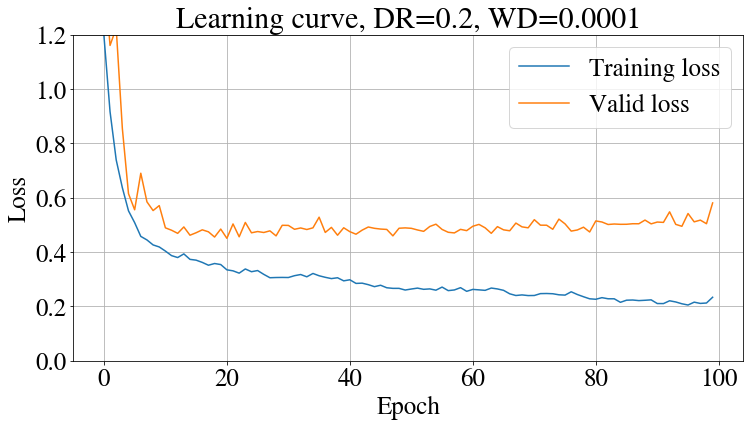

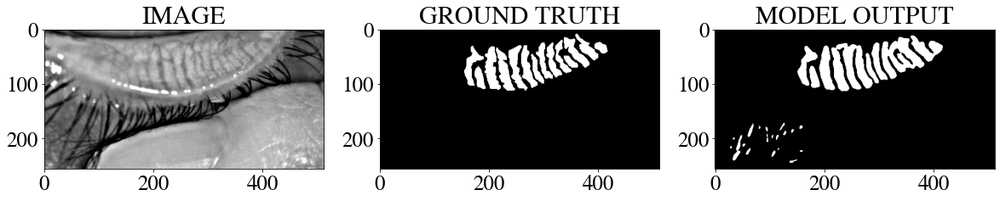

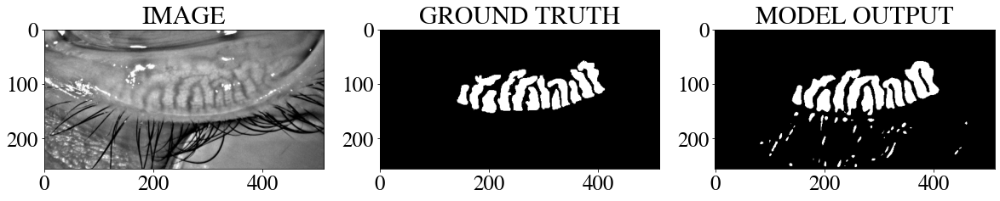

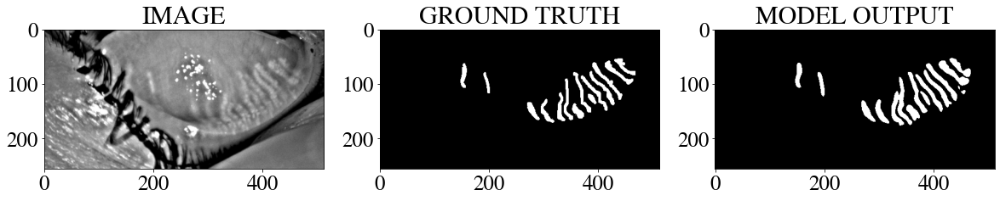

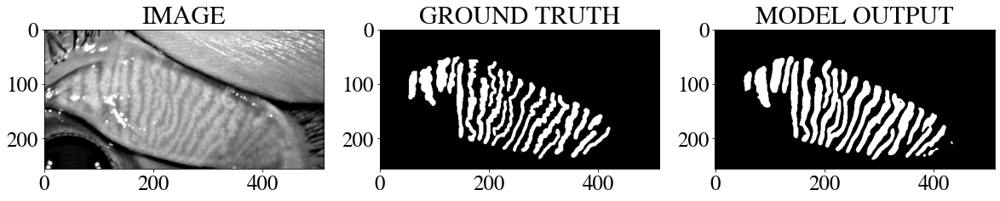

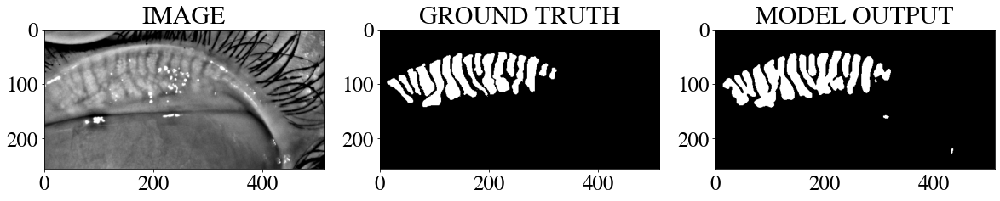



VALID


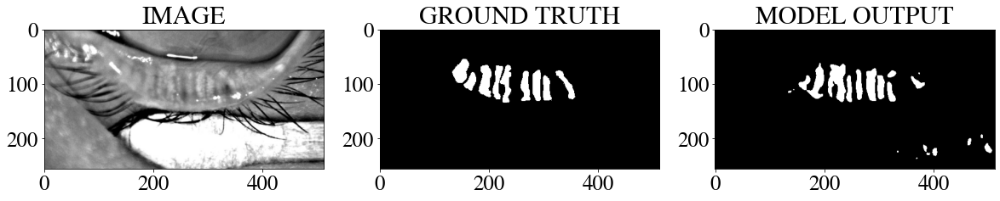

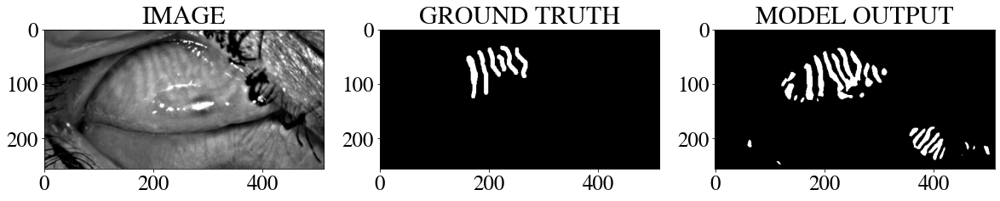

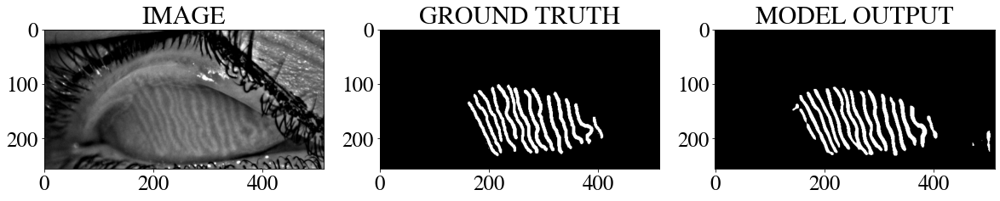

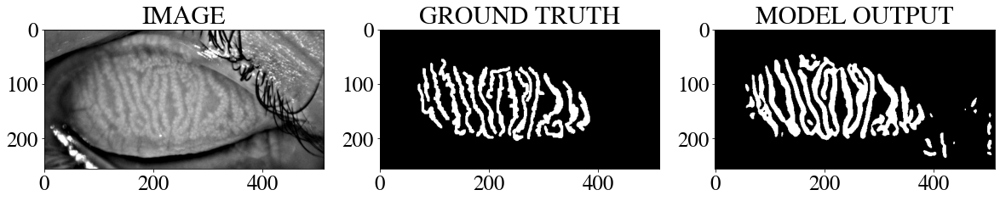

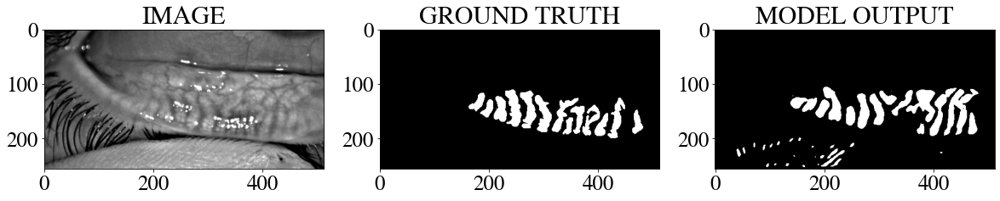

In [ ]:
EPOCH=100
LR=0.001

dropouts = [0.2]
weight_decays = [0.0001]


for dropout in dropouts:
  for weight_decay in weight_decays:

    class SegmentationModel(nn.Module):
      def __init__(self):
        super(SegmentationModel, self).__init__()  #super: para crear en pytorch la arquitectura

        self.backbone=smp.Unet(           #cargando el modelo para segmentar vamos a usar unet
            encoder_name=ENCODER,         # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
            encoder_weights=WEIGHTS,      # use `imagenet` pre-trained weights for encoder initialization
            in_channels=3,                # model input channels (1 for gray-scale images, 3 for RGB, etc.)
            classes=1,                    # model output channels (number of classes in your dataset)
            activation=None,              #No le queremos aplicar alguna función de activación a la salida, por eso retorna logits
            aux_params = {'classes': 1,'dropout':dropout}

        )

      def forward(self, images, masks=None):
        logits,_=self.backbone(images)   #definiendo la arquitectura del forward pass como la arquitectura predefinida   
        # model produce not only mask, but also label output with shape NC       

        if(masks!=None):
          #Cuando mask es diferente de none significa que se está entrenando pues se conoce la máscara pero cuando es None se está testeando

          #el output va a ser logits i,e raw output, sin ninguna funcion de activacion aplicada como sigmoid
          #se le va a sumar BCE (Binary cross entropy)
          return logits, DiceLoss(mode="binary")(logits, masks) + nn.BCEWithLogitsLoss()(logits, masks)
        
        return logits


    model=SegmentationModel()
    model.to(DEVICE)  #.to(DEVICE): le dice a PyTorch que todos los cálculos realizados con este objeto sean hecho en
                      #el device que uno quiera, en este caso GPU 



    #IMG_SIZE=512

    optimizer=torch.optim.Adam(model.parameters(), lr=LR,  weight_decay=  weight_decay )  #iniciando el optimizador

    print(f"DR={dropout}, WD={ weight_decay}")
    print("\n")
    best_loss=200

    train_loss_history =[]
    valid_loss_history =[]

    path = '/content/drive/MyDrive/proyecto aprendizaje estadistico/Pruebas con otras arquitecturas/models/'

    save_model_path = path +"best-model_DR=%s_WD=%s.pt"%(dropout, weight_decay)

    for i in range(EPOCH):
      train_loss=train_fn(trainloader, model, optimizer)
      valid_loss=eval_fn(validloader, model)
      
      train_loss_history.append(train_loss)
      valid_loss_history.append(valid_loss)


      if(valid_loss<best_loss):
        #Guardando el mejor modelo
        torch.save(model.state_dict(), save_model_path )
        print("SAVED MODEL")

        #reasignando valores del mejor modelo
        best_loss=valid_loss

      print(f"Epoch:{i+1} train loss:{train_loss} valid loss:{valid_loss}")


    plt.figure(figsize=(12,6))
    plt.title(f"Learning curve, DR={dropout}, WD={ weight_decay}")
    plt.plot(train_loss_history, label = 'Training loss')
    plt.plot(valid_loss_history, label = 'Valid loss')

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.ylim(0,1.2)
    plt.grid()
    plt.legend()

    print("TRAINING")
    for idx in range(5):
      #print(train_df.iloc[idx]['imagenes'])
      show_results(trainset,idx)
      plt.show()
    print("\n")

    print("VALID")
    for idx in range(5):
      #print(valid_df.iloc[idx]['imagenes'])
      show_results(validset,idx)
      plt.show()
    print("\n")

### Según las curvas de aprendizaje se presenta Overfitting alrededor de la época 30, esto es debido a la poca cantidad de imágenes que se posee

### Significado optimizer.zero_grad()

in PyTorch, for every mini-batch during the training phase, we typically want to explicitly set the gradients to zero before starting to do backpropragation (i.e., updating the Weights and biases) because PyTorch accumulates the gradients on subsequent backward passes. This accumulating behaviour is convenient while training RNNs or when we want to compute the gradient of the loss summed over multiple mini-batches. So, the default action has been set to accumulate (i.e. sum) the gradients on every loss.backward() call.

Because of this, when you start your training loop, ideally you should zero out the gradients so that you do the parameter update correctly. Otherwise, the gradient would be a combination of the old gradient, which you have already used to update your model parameters, and the newly-computed gradient. It would therefore point in some other direction than the intended direction towards the minimum (or maximum, in case of maximization objectives).

## 10. Prueba de resultados

In [ ]:
idx = 3

#model.load_state_dict( (torch.load('/content/drive/MyDrive/proyecto aprendizaje estadistico/best-model.pt' ) ) ) #cargando el modelo
#model.load_state_dict( (torch.load('best-model.pt' ) ) ) #cargando el modelo


image, mask =validset[idx]   #retornando alguna imagen y su máscara del conjunto de validación

logits_mask = model(image.to(DEVICE).unsqueeze(0))
#unsqueeze lo que hace es convertir (c,h,w) a (batch,c,h,w) para que se puede probar el modelo

pred_mask = torch.sigmoid(logits_mask) #aplicando sigmoid a los logits

pred_mask = (pred_mask >0.5)*1.0
#si pred_mask >0.5 entonces el valor se le cambia el valor a 1, si es menor a 0.5 se le cambia a 0

Tensor.detach() is used to detach a tensor from the current computational graph. It returns a new tensor that doesn't require a gradient.

When we don't need a tensor to be traced for the gradient computation, we detach the tensor from the current computational graph.

We also need to detach a tensor when we need to move the tensor from GPU to CPU.


It returns a new tensor without requires_grad = True. The gradient with respect to this tensor will no longer be computed.

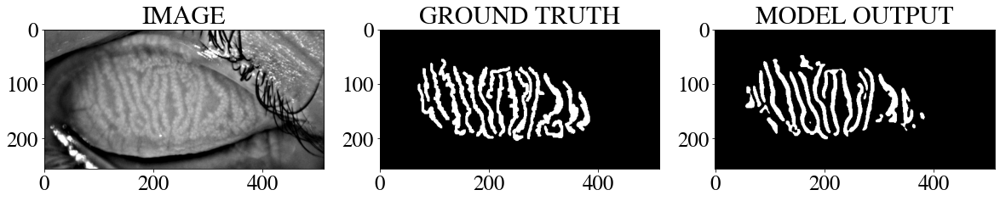

In [ ]:
show_image(image, mask, pred_mask.detach().cpu().squeeze(0) )
#.detach()--> separa del grafo de la NN y ya no se necesita calcular su gradiente

#.cpu()--> para pasarlo a cpu
#.squeeze(0) para eliminar la dimension extra que se le puso anteriormente

## 10.1 Prueba de la segmentación en el conjunto de entrenamiento

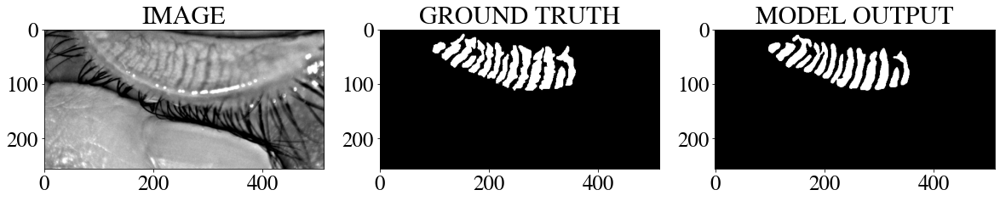

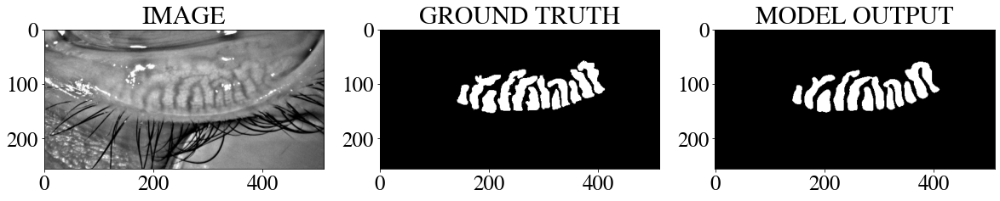

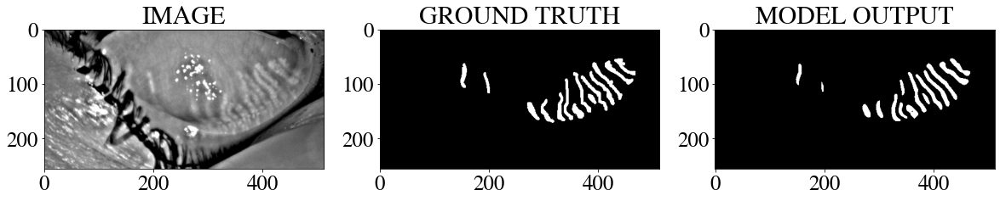

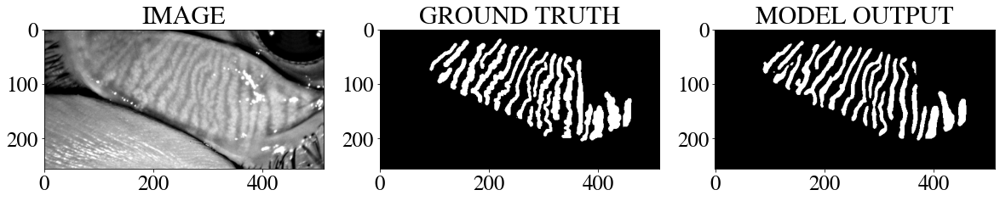

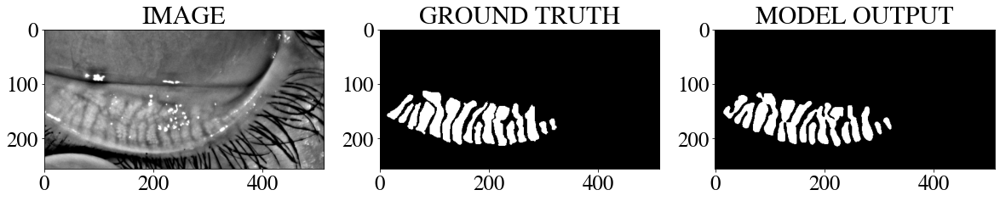

...

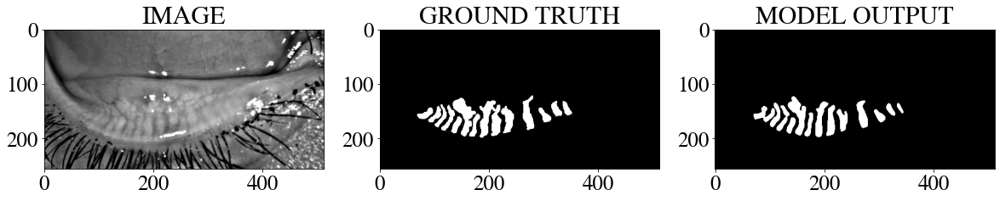

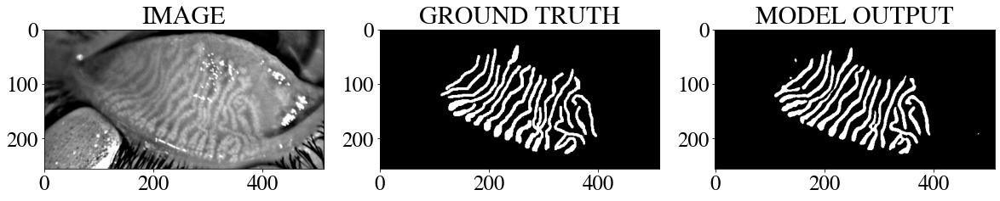

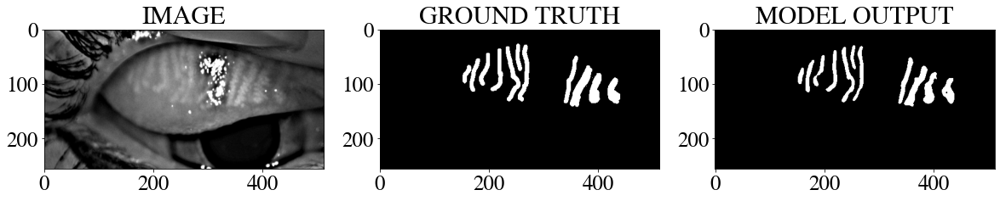

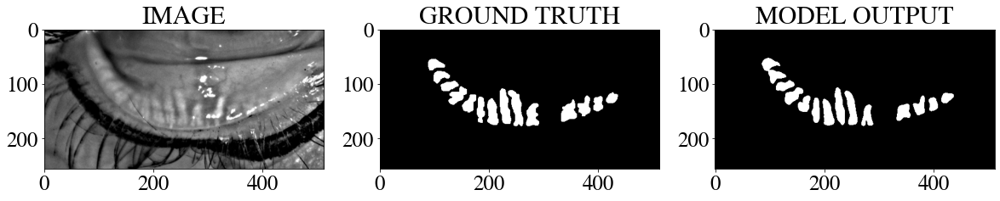

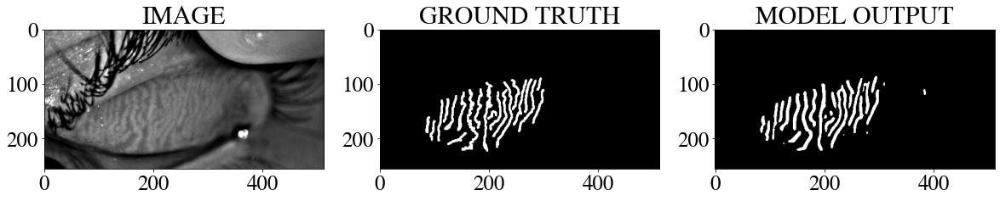

In [ ]:
for idx in range(50):
  #print(train_df.iloc[idx]['imagenes'])
  show_results(trainset,idx)
  plt.show()
  print("\n")

## 10.2 Prueba de la segmentación en el conjunto de test

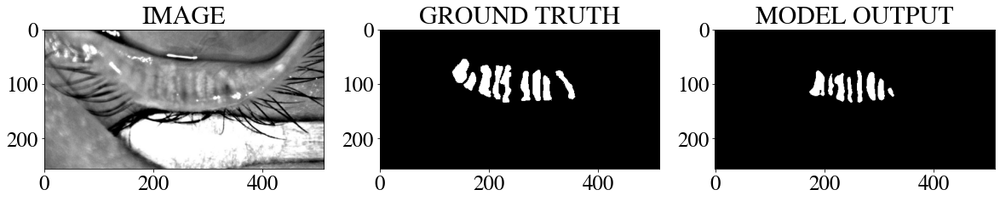

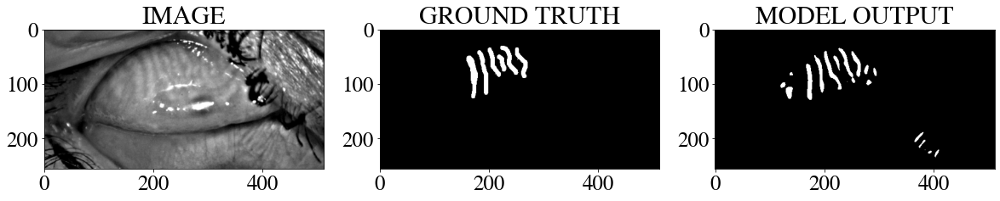

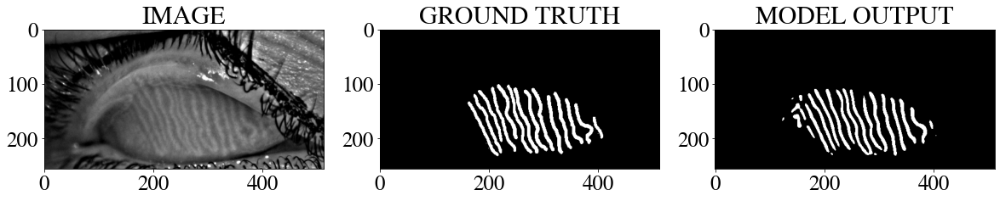

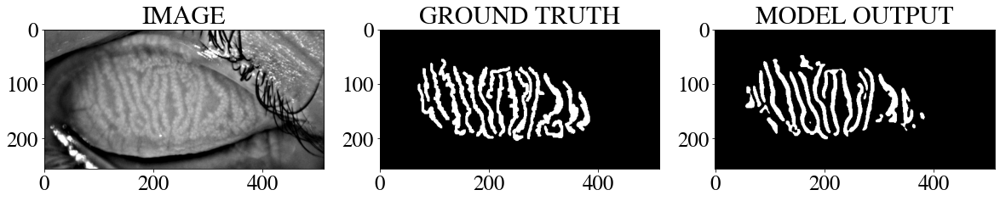

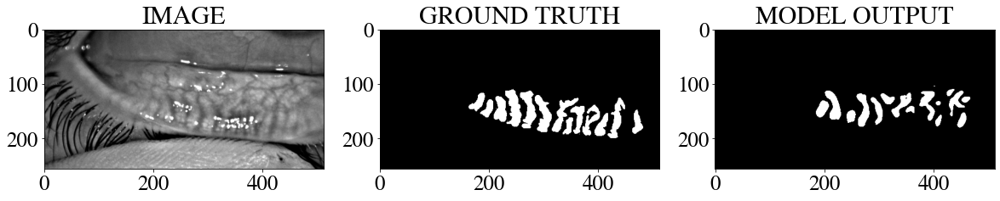

...

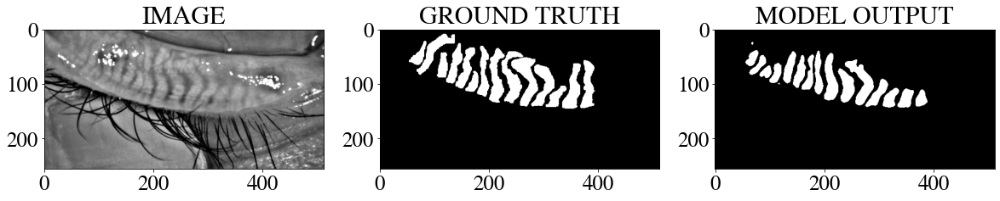

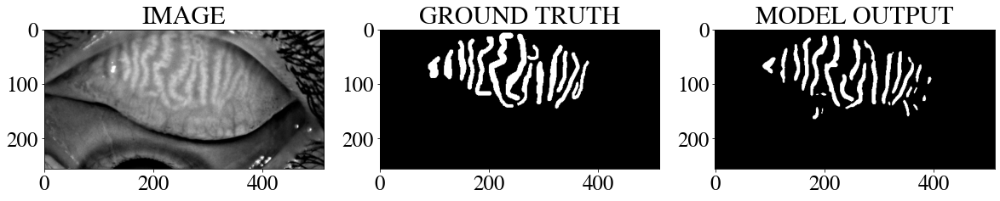

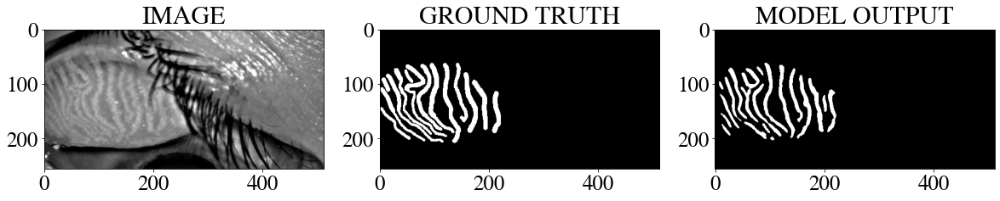

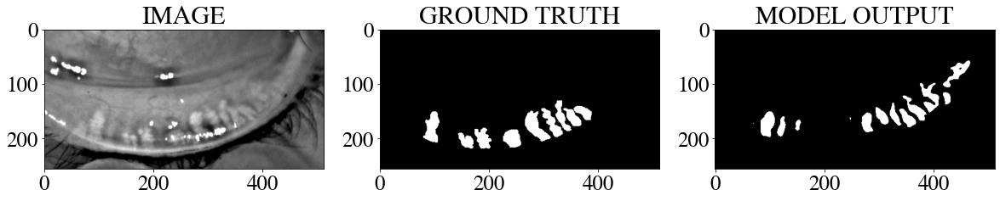

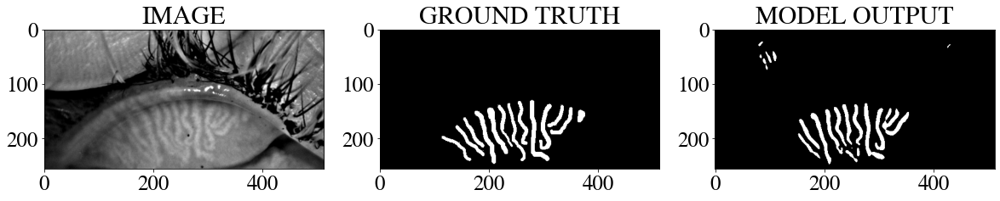

In [ ]:
for idx in range(len(valid_df)):
  #print(valid_df.iloc[idx]['imagenes'])
  show_results(validset,idx)
  plt.show()
  print("\n")
  
  

## 11. Conclusiones

- A pesar de las pocas imágenes que se tiene para el entrenamiento de la red neuronal se observa que esta es capaz de segmentar de manera aceptable las glándulas de Meibomio

- La red neuronal se le dificulta más segmentar las imágenes del párpado superior en comparación a las del párpado inferior

- Según las curvas de aprendizaje se presenta Overfitting alrededor de la época 30, esto es debido a la poca cantidad de imágenes que se posee

- La red neuronal es capaz de ignorar los destellos debido a inperfecciones en la toma de las imágenes

- Se desea mejorar los resultados aumentando el conjunto de datos para entrenamiento






Notebook modificado del el curso de Cousera: Aerial image segmentation with Pytorch
Autor:@parth_AI

Linkedin : www.linkedin.com/in/pdhameliya

